<a href="https://colab.research.google.com/github/egfitter/cohort10_capstone/blob/Regression-Comparisons/Regression_Comparisons_Final_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### install libraries

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import psycopg2 as pg
from psycopg2 import sql
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os
from shapely.geometry import Point
import xml.etree.ElementTree as ET
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_squared_error
from sklearn.dummy import DummyRegressor
from xgboost import XGBRegressor
import folium
from folium.plugins import HeatMap
import graphviz
from IPython.display import display
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
import sklearn.model_selection as model_selection
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import geopandas as gpd
import folium
from shapely.geometry import Point
from folium.plugins import MiniMap
from sklearn.metrics import r2_score
import graphviz
from IPython.display import display
from sklearn import tree

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Problem Definition

Citizen Science may be an under recognised data collection method. With Tree Based and linear regression modeling we are hoping to show how citizen science and other publicly available data sources can be used to show the importance of Proper soil, land use designation and supporting species on the prevalence of keystone species in Albuquerque.

#Data Collection and Sources

The original data set was collected from 3 sources: the [iNaturalist](https://www.inaturalist.org/) organism observation initiative, the [USDA Web Soil Survey](https://websoilsurvey.nrcs.usda.gov/app/), and the [Multi-Resolution Land Characteristics Consortium](https://www.mrlc.gov/data). All data covers the same geographical area in the Albuquerque metro area and includes organism observations, soil types, and types of land cover. Although the data was collected from 3 different sources, we were able to create a database using PostgreSQL and use the geographical data to link the tables. The data used in this notebook has been pulled from the database and saved into a geojson file.

Pull in geojson file and write it to a dataframe

In [4]:
# Specify the path to the GeoJSON file in your Google Drive
geojson_path = '/content/drive/MyDrive/Colab Notebooks/Capstone/Data/keystone_luse_soil.geojson'

# Read the GeoJSON file into a GeoDataFrame
keystone_lcover_soil = gpd.read_file(geojson_path)

keystone_lcover_soil.head(10)

,id_left,observed_on_string,observed_on,time_observed_at,place_guess,latitude,longitude,positional_accuracy,positioning_method,species_guess,...,fid,soil_type,index_landcover,raster_val,Class/Value,Classification,Description,hex,is_keystone,geometry
0,100002619,2021/11/01 11:17 AM MDT,2021-11-01,2021-11-01 17:17:00 UTC,"2201 Tucker Ave NE, Albuquerque, NM 87131, USA",35.0924332,-106.6202136,185,,Dainty Sulphur,...,13,EtC,43996,22.0,22,"Developed, Low Intensity",areas with a mixture of constructed materials ...,#d99282,0,POINT (-106.62021 35.09243)
1,100004136,2021-11-01 13:46:48,2021-11-01,2021-11-01 19:46:48 UTC,"Dane Smith Hall, Albuquerque, NM 87106, USA",35.0860511,-106.6228674,60,,Fiery Skipper,...,96,Cu,45794,24.0,24,Developed High Intensity,highly developed areas where people reside or ...,#ab0000,0,POINT (-106.62287 35.08605)
2,100004148,Mon Nov 01 2021 13:50:16 GMT-0600 (MDT),2021-11-01,2021-11-01 19:50:16 UTC,"The University of New Mexico, Albuquerque, NM, US",35.0848286413,-106.6226066464,5,,Mallard,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62261 35.08483)
3,100004441,2021-11-01 13:53:27,2021-11-01,2021-11-01 19:53:27 UTC,"Yale @ Las Lomas (Dane Smith Hall), Albuquerqu...",35.08536904,-106.62234527,8,,American Wigeon,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62235 35.08537)
4,100004517,2021-11-01 13:54:07,2021-11-01,2021-11-01 19:54:07 UTC,"Yale @ Las Lomas (Dane Smith Hall), Albuquerqu...",35.08536415,-106.62232799,9,,Asian Lady Beetle,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62233 35.08536)
5,100004647,2021-11-01 13:55:05,2021-11-01,2021-11-01 19:55:05 UTC,"Yale @ Las Lomas (Dane Smith Hall), Albuquerqu...",35.08531664,-106.62247663,20,,Feral Pigeon,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62248 35.08532)
6,100004974,2021-11-01 13:58:25,2021-11-01,2021-11-01 19:58:25 UTC,"Central Campus, Albuquerque, NM, USA",35.08552114,-106.62287672,16,,Garden Snail,...,96,Cu,45908,23.0,23,"Developed, Medium Intensity",areas with a mixture of constructed materials ...,#eb0000,0,POINT (-106.62288 35.08552)
7,100006947,2021-11-01 14:20:26,2021-11-01,2021-11-01 20:20:26 UTC,"Central Campus, Albuquerque, NM, USA",35.08482251,-106.62265539,8,,Red-eared Slider,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62266 35.08482)
8,100007357,2021-11-01 14:24:26,2021-11-01,2021-11-01 20:24:26 UTC,"Mitchell Hall (Classrooms), Albuquerque, NM 87...",35.08482189,-106.62268333,13,,Red-shouldered Bug,...,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62268 35.08482)
9,100008001,Mon Nov 01 2021 15:32:52 GMT-0500 (CDT),2021-11-01,2021-11-01 21:32:52 UTC,"Riverview Heights, Albuquerque, NM, US",35.0964481384,-106.6924328451,10,,silverleaf nightshade,...,258,TP,44714,95.0,95,Emergent Herbaceous Wetlands,Areas where perennial herbaceous vegetation ac...,#6c9fb8,0,POINT (-106.69243 35.09645)


In [5]:
keystone_lcover_soil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 63584 entries, 0 to 63583
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   id_left              63584 non-null  object  
 1   observed_on_string   63584 non-null  object  
 2   observed_on          63584 non-null  object  
 3   time_observed_at     63584 non-null  object  
 4   place_guess          63584 non-null  object  
 5   latitude             63584 non-null  object  
 6   longitude            63584 non-null  object  
 7   positional_accuracy  63584 non-null  object  
 8   positioning_method   63584 non-null  object  
 9   species_guess        63584 non-null  object  
 10  scientific_name      63584 non-null  object  
 11  common_name          63584 non-null  object  
 12  iconic_taxon_name    63584 non-null  object  
 13  taxon_id             63584 non-null  object  
 14  taxon_kingdom_name   63584 non-null  object  
 15  taxon_phylu

#Data Cleaning

##change some datatypes

In [6]:
# Convert the 'time_observed_at' column to datetime
keystone_lcover_soil['time_observed_at'] = pd.to_datetime(keystone_lcover_soil['time_observed_at'])

In [7]:
keystone_lcover_soil['latitude']=keystone_lcover_soil['latitude'].astype(float)

In [8]:
keystone_lcover_soil['longitude']=keystone_lcover_soil['longitude'].astype(float)

In [9]:
keystone_lcover_soil['taxon_genus_name'].value_counts()

Geococcyx      1282
Anas           1221
Zenaida         950
Apis            942
Solanum         901
               ... 
Agenioideus       1
Neacoryphus       1
Lemna             1
Myotis            1
Juriniopsis       1
Name: taxon_genus_name, Length: 1692, dtype: int64

##assign grid sections to area

In [10]:
latmax=  keystone_lcover_soil['latitude'].max()+0.00001
latmax

35.2180534059

In [11]:
longmax=  keystone_lcover_soil['longitude'].max()+0.00001
longmax

-106.4711550813

In [12]:
latmin=  keystone_lcover_soil['latitude'].min()
latmin

34.9472329722

In [13]:
longmin =  keystone_lcover_soil['longitude'].min()
longmin

-106.8815165994

In [14]:
quads=10

In [15]:
latstep=(latmax-latmin)/quads
latstep

0.027082043370000263

In [16]:
longstep=(longmax-longmin)/quads
longstep

0.04103615181000038

In [17]:
# Function to assign grid section based on latitude and longitude ranges
def assign_grid_section(row):
    lat = row['latitude']
    lon = row['longitude']

    for section, ranges in grid_ranges.items():
        lat_range = ranges['lat_range']
        lon_range = ranges['lon_range']

        if lat_range[0] <= lat < lat_range[1] and lon_range[0] <= lon < lon_range[1]:
            return section

    # If not in any defined grid section
    return None

# Define the latitude and longitude ranges for each grid section
grid_ranges = {}
for section in range(1,((quads**2)+1)):
    lat_min = latmin + (((section - 1) // quads) * latstep)
    lat_max = lat_min + latstep
    lon_min = longmin + (((section - 1) % quads) * longstep)
    lon_max = lon_min + longstep
    grid_ranges[section] = {'lat_range': (lat_min, lat_max), 'lon_range': (lon_min, lon_max)}

# Apply the function to assign grid sections to each row in the dataset
keystone_lcover_soil['grid_section'] = keystone_lcover_soil.apply(assign_grid_section, axis=1)

# Display the updated DataFrame
keystone_lcover_soil.head()

,id_left,observed_on_string,observed_on,time_observed_at,place_guess,latitude,longitude,positional_accuracy,positioning_method,species_guess,...,soil_type,index_landcover,raster_val,Class/Value,Classification,Description,hex,is_keystone,geometry,grid_section
0,100002619,2021/11/01 11:17 AM MDT,2021-11-01,2021-11-01 17:17:00+00:00,"2201 Tucker Ave NE, Albuquerque, NM 87131, USA",35.092433,-106.620214,185,,Dainty Sulphur,...,EtC,43996,22.0,22,"Developed, Low Intensity",areas with a mixture of constructed materials ...,#d99282,0,POINT (-106.62021 35.09243),57
1,100004136,2021-11-01 13:46:48,2021-11-01,2021-11-01 19:46:48+00:00,"Dane Smith Hall, Albuquerque, NM 87106, USA",35.086051,-106.622867,60,,Fiery Skipper,...,Cu,45794,24.0,24,Developed High Intensity,highly developed areas where people reside or ...,#ab0000,0,POINT (-106.62287 35.08605),57
2,100004148,Mon Nov 01 2021 13:50:16 GMT-0600 (MDT),2021-11-01,2021-11-01 19:50:16+00:00,"The University of New Mexico, Albuquerque, NM, US",35.084829,-106.622607,5,,Mallard,...,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62261 35.08483),57
3,100004441,2021-11-01 13:53:27,2021-11-01,2021-11-01 19:53:27+00:00,"Yale @ Las Lomas (Dane Smith Hall), Albuquerqu...",35.085369,-106.622345,8,,American Wigeon,...,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62235 35.08537),57
4,100004517,2021-11-01 13:54:07,2021-11-01,2021-11-01 19:54:07+00:00,"Yale @ Las Lomas (Dane Smith Hall), Albuquerqu...",35.085364,-106.622328,9,,Asian Lady Beetle,...,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62233 35.08536),57


In [18]:
print(keystone_lcover_soil['grid_section'].min())
print(keystone_lcover_soil['grid_section'].max())

1
100


##Drop unnecessary columns

In [19]:
keystone_lcover_soil_clean = keystone_lcover_soil.copy()

In [20]:
keystone_lcover_soil_clean = keystone_lcover_soil_clean.drop([
    'id_left', 'observed_on_string', 'observed_on',
    'place_guess', 'positional_accuracy',
    'positioning_method', 'species_guess', 'scientific_name', 'common_name',
    'iconic_taxon_name', 'taxon_id', 'taxon_kingdom_name', 'taxon_phylum_name',
    'taxon_class_name', 'taxon_order_name', 'taxon_family_name', 'taxon_tribe_name',
     'taxon_species_name', 'taxon_form_name'
], axis = 1)

In [21]:
keystone_lcover_soil_clean.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 63584 entries, 0 to 63583
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   time_observed_at  59814 non-null  datetime64[ns, UTC]
 1   latitude          63584 non-null  float64            
 2   longitude         63584 non-null  float64            
 3   taxon_genus_name  63584 non-null  object             
 4   index_right       63584 non-null  int64              
 5   id_right          63584 non-null  int64              
 6   fid               63584 non-null  int64              
 7   soil_type         63584 non-null  object             
 8   index_landcover   63584 non-null  int64              
 9   raster_val        63584 non-null  float64            
 10  Class/Value       63584 non-null  int64              
 11  Classification    63584 non-null  object             
 12  Description       63584 non-null  object            

##Deal with null values

In [22]:
# Replace null values with the mean of the 'time_observed_at' column
mean_date = keystone_lcover_soil_clean['time_observed_at'].mean()
keystone_lcover_soil_clean['time_observed_at'].fillna(mean_date, inplace=True)


In [23]:
keystone_lcover_soil_clean.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 63584 entries, 0 to 63583
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   time_observed_at  63584 non-null  datetime64[ns, UTC]
 1   latitude          63584 non-null  float64            
 2   longitude         63584 non-null  float64            
 3   taxon_genus_name  63584 non-null  object             
 4   index_right       63584 non-null  int64              
 5   id_right          63584 non-null  int64              
 6   fid               63584 non-null  int64              
 7   soil_type         63584 non-null  object             
 8   index_landcover   63584 non-null  int64              
 9   raster_val        63584 non-null  float64            
 10  Class/Value       63584 non-null  int64              
 11  Classification    63584 non-null  object             
 12  Description       63584 non-null  object            

In [24]:
keystone_lcover_soil_clean.head()

,time_observed_at,latitude,longitude,taxon_genus_name,index_right,id_right,fid,soil_type,index_landcover,raster_val,Class/Value,Classification,Description,hex,is_keystone,geometry,grid_section
0,2021-11-01 17:17:00+00:00,35.092433,-106.620214,Nathalis,9,10,13,EtC,43996,22.0,22,"Developed, Low Intensity",areas with a mixture of constructed materials ...,#d99282,0,POINT (-106.62021 35.09243),57
1,2021-11-01 19:46:48+00:00,35.086051,-106.622867,Hylephila,25,26,96,Cu,45794,24.0,24,Developed High Intensity,highly developed areas where people reside or ...,#ab0000,0,POINT (-106.62287 35.08605),57
2,2021-11-01 19:50:16+00:00,35.084829,-106.622607,Anas,25,26,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62261 35.08483),57
3,2021-11-01 19:53:27+00:00,35.085369,-106.622345,Mareca,25,26,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62235 35.08537),57
4,2021-11-01 19:54:07+00:00,35.085364,-106.622328,Harmonia,25,26,96,Cu,46233,21.0,21,"Developed, Open Space",areas with a mixture of some constructed mater...,#dec5c5,0,POINT (-106.62233 35.08536),57


In [25]:
#look at the number of unique values in each ramaining column
unique_counts = keystone_lcover_soil_clean.nunique()
unique_counts

time_observed_at    57010
latitude            49533
longitude           48129
taxon_genus_name     1692
index_right            49
id_right               49
fid                    49
soil_type              49
index_landcover      7238
raster_val             14
Class/Value            14
Classification         14
Description            14
hex                    14
is_keystone             2
geometry            53150
grid_section           98
dtype: int64

My cleaned data still has high cardinality so I will drop some more columns

In [26]:
keystone_lcover_soil_clean = keystone_lcover_soil_clean.drop(['time_observed_at', 'index_right','id_right', 'fid', 'index_landcover', 'raster_val', 'Class/Value', 'Description', 'hex' ], axis = 1)

In [27]:
keystone_lcover_soil_clean.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 63584 entries, 0 to 63583
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   latitude          63584 non-null  float64 
 1   longitude         63584 non-null  float64 
 2   taxon_genus_name  63584 non-null  object  
 3   soil_type         63584 non-null  object  
 4   Classification    63584 non-null  object  
 5   is_keystone       63584 non-null  int64   
 6   geometry          63584 non-null  geometry
 7   grid_section      63584 non-null  int64   
dtypes: float64(2), geometry(1), int64(2), object(3)
memory usage: 3.9+ MB


In [28]:
keystone_lcover_soil_clean.head()

,latitude,longitude,taxon_genus_name,soil_type,Classification,is_keystone,geometry,grid_section
0,35.092433,-106.620214,Nathalis,EtC,"Developed, Low Intensity",0,POINT (-106.62021 35.09243),57
1,35.086051,-106.622867,Hylephila,Cu,Developed High Intensity,0,POINT (-106.62287 35.08605),57
2,35.084829,-106.622607,Anas,Cu,"Developed, Open Space",0,POINT (-106.62261 35.08483),57
3,35.085369,-106.622345,Mareca,Cu,"Developed, Open Space",0,POINT (-106.62235 35.08537),57
4,35.085364,-106.622328,Harmonia,Cu,"Developed, Open Space",0,POINT (-106.62233 35.08536),57


##Encode remaining categorical data

In [29]:
# Define the columns to perform one-hot encoding on
columns_to_encode = ['taxon_genus_name', 'soil_type', 'Classification']

# Use pd.get_dummies() to perform one-hot encoding
keystone_lcover_soil_clean_encoded = pd.get_dummies(keystone_lcover_soil_clean, columns=columns_to_encode)

# # Loop through the columns and apply frequency encoding
# for column in columns_to_encode:
#     # Calculate the frequency of each category and create a mapping dictionary
#     freq_mapping = keystone_lcover_soil_clean[column].value_counts().to_dict()

#     # Apply frequency encoding using the mapping dictionary
#     keystone_lcover_soil_clean[column + '_encoded'] = keystone_lcover_soil_clean[column].map(freq_mapping)

In [30]:
keystone_lcover_soil_clean_encoded.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 63584 entries, 0 to 63583
Columns: 1760 entries, latitude to Classification_Woody Wetlands
dtypes: float64(2), geometry(1), int64(2), uint8(1755)
memory usage: 108.8 MB


In [31]:
keystone_lcover_soil_clean_encoded.head()

,latitude,longitude,is_keystone,geometry,grid_section,taxon_genus_name_,taxon_genus_name_Abaeis,taxon_genus_name_Abagrotis,taxon_genus_name_Abies,taxon_genus_name_Abronia,...,"Classification_Developed, Medium Intensity","Classification_Developed, Open Space",Classification_Emergent Herbaceous Wetlands,Classification_Evergreen Forest,Classification_Grassland/Herbaceous,Classification_Open Water,Classification_Pasture/Hay,Classification_Shrub/Scrub,Classification_Unclassified,Classification_Woody Wetlands
0,35.092433,-106.620214,0,POINT (-106.62021 35.09243),57,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,35.086051,-106.622867,0,POINT (-106.62287 35.08605),57,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,35.084829,-106.622607,0,POINT (-106.62261 35.08483),57,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,35.085369,-106.622345,0,POINT (-106.62235 35.08537),57,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,35.085364,-106.622328,0,POINT (-106.62233 35.08536),57,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [32]:
type(keystone_lcover_soil_clean_encoded['is_keystone'])

pandas.core.series.Series

#Exploratory Data Analysis

##Explore iNaturalist dataset with an unsupervised clustering algorithm

In [33]:
albcsv = '/content/drive/MyDrive/Cohort 10 Capstone/data/iNaturalist/iNaturalist, last 3 years ABQ.csv'

alb_in_df = pd.read_csv(albcsv)

In [34]:
alb_in_df.head(10)

,id,observed_on_string,observed_on,time_observed_at,place_guess,latitude,longitude,positional_accuracy,positioning_method,species_guess,...,taxon_kingdom_name,taxon_phylum_name,taxon_class_name,taxon_order_name,taxon_family_name,taxon_tribe_name,taxon_genus_name,taxon_species_name,taxon_subspecies_name,taxon_form_name
0,145597929,2023-01-01 11:27:07-07:00,2023-01-01,2023-01-01 18:27:07 UTC,"Guadalupe Trail NW, Albuquerque, NM, US",35.193462,-106.625770,10.0,NaN,Leptoglossus oppositus,...,Animalia,Arthropoda,Insecta,Hemiptera,Coreidae,Anisoscelini,Leptoglossus,Leptoglossus oppositus,NaN,NaN
1,145598436,2023-01-01 12:06:23-07:00,2023-01-01,2023-01-01 19:06:23 UTC,"Guadalupe Trail NW, Albuquerque, NM, US",35.193388,-106.626175,35.0,NaN,American Crow,...,Animalia,Chordata,Aves,Passeriformes,Corvidae,NaN,Corvus,Corvus brachyrhynchos,NaN,NaN
2,145600357,2023-01-01 09:24:49,2023-01-01,2023-01-01 16:24:49 UTC,"Central Campus, Albuquerque, NM, USA",35.084996,-106.622378,274.0,gps,American Wigeon,...,Animalia,Chordata,Aves,Anseriformes,Anatidae,NaN,Mareca,Mareca americana,NaN,NaN
3,145600520,2023-01-01 09:28:14,2023-01-01,2023-01-01 16:28:14 UTC,The University of New Mexico,35.084987,-106.622321,249.0,gps,Ring-necked Duck,...,Animalia,Chordata,Aves,Anseriformes,Anatidae,NaN,Aythya,Aythya collaris,NaN,NaN
4,145620882,2023/01/01 4:41 PM,2023-01-01,2023-01-01 23:41:00 UTC,"Los Ranchos De Albuquerque, NM, USA",35.144321,-106.674812,2.0,NaN,American Dipper,...,Animalia,Chordata,Aves,Passeriformes,Cinclidae,NaN,Cinclus,Cinclus mexicanus,NaN,NaN
5,145623376,2023-01-01 17:09:48-07:00,2023-01-01,2023-01-02 00:09:48 UTC,"New Mexico, US",35.157300,-106.655912,9.0,NaN,Fourwing Saltbush,...,Plantae,Tracheophyta,Magnoliopsida,Caryophyllales,Amaranthaceae,Atripliceae,Atriplex,Atriplex canescens,NaN,NaN
6,145626961,2023/01/01 12:47 PM,2023-01-01,2023-01-01 19:47:00 UTC,"Near North Valley, Albuquerque, NM, USA",35.119632,-106.657243,198.0,NaN,Desert Cottontail,...,Animalia,Chordata,Mammalia,Lagomorpha,Leporidae,NaN,Sylvilagus,Sylvilagus audubonii,NaN,NaN
7,145672685,2023-01-01 15:25:02-07:00,2023-01-01,2023-01-01 22:25:02 UTC,"Rio Grande, Albuquerque, NM, US",35.055836,-106.658133,4.0,NaN,Sandhill Crane,...,Animalia,Chordata,Aves,Gruiformes,Gruidae,NaN,Antigone,Antigone canadensis,NaN,NaN
8,145685754,2023-01-02 12:17:21,2023-01-02,2023-01-02 19:17:21 UTC,"Comanche @ Tramway, Albuquerque, NM 87111, USA",35.123285,-106.497561,11.0,gps,Ruby-crowned Kinglet,...,Animalia,Chordata,Aves,Passeriformes,Regulidae,NaN,Corthylio,Corthylio calendula,NaN,NaN
9,145691546,2023-01-02 13:29:38-07:00,2023-01-02,2023-01-02 20:29:38 UTC,"The University of New Mexico, Albuquerque, NM, US",35.085245,-106.622170,4.0,NaN,American Wigeon,...,Animalia,Chordata,Aves,Anseriformes,Anatidae,NaN,Mareca,Mareca americana,NaN,NaN


find how many unique values are in each column. I want to do one hot encoding, but I want to be strategic about it. Before we do clustering, we have to drop certain columns and encode some data so that we can make sure that the clustering isn't based on something we don't necessarialy want - like latitude and longitude

In [35]:

unique_counts = alb_in_df.nunique()

print("Number of unique values in each column:")
print(unique_counts)

Number of unique values in each column:
id                       13004
observed_on_string       11988
observed_on                233
time_observed_at         11896
place_guess               1320
latitude                 10634
longitude                10539
positional_accuracy        757
positioning_method           1
species_guess             1580
scientific_name           1369
common_name               1115
iconic_taxon_name           11
taxon_id                  1374
taxon_kingdom_name           4
taxon_phylum_name            8
taxon_class_name            21
taxon_order_name            95
taxon_family_name          350
taxon_tribe_name           393
taxon_genus_name           973
taxon_species_name        1178
taxon_subspecies_name       36
taxon_form_name              1
dtype: int64


In [36]:
# Select the desired columns
selected_columns = ['taxon_kingdom_name', 'taxon_phylum_name', 'taxon_class_name', 'taxon_order_name', 'taxon_id']

# Create a new DataFrame with only the selected columns
df_for_clustering = alb_in_df[selected_columns].copy()

In [37]:
df_for_clustering.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13004 entries, 0 to 13003
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   taxon_kingdom_name  13004 non-null  object
 1   taxon_phylum_name   13004 non-null  object
 2   taxon_class_name    13004 non-null  object
 3   taxon_order_name    13004 non-null  object
 4   taxon_id            13004 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 508.1+ KB


In [38]:
# Perform one-hot encoding on the categorical columns
df_encoded = pd.get_dummies(df_for_clustering, columns=['taxon_kingdom_name', 'taxon_phylum_name', 'taxon_class_name', 'taxon_order_name'])

In [39]:
df_encoded.shape

(13004, 129)

normalize data using standardscaler. The standard scaler transforms data so that it has a mean of 0 and a standard deviation on 1. The transformation is applied independently to each column so that all features wind up having the same scale. the K-means clustering algorithm is distance based so scaling our data is essential when processing data before use

In [40]:
# Standardization (z-score scaling)
scaler_standard = StandardScaler()
scaled_data_standard = scaler_standard.fit_transform(df_encoded)

# Create a new DataFrame with the scaled data
df_encoded = pd.DataFrame(scaled_data_standard, columns=df_encoded.columns)

In [41]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13004 entries, 0 to 13003
Columns: 129 entries, taxon_id to taxon_order_name_Zygophyllales
dtypes: float64(129)
memory usage: 12.8 MB


In [42]:
df_encoded.head(5)

,taxon_id,taxon_kingdom_name_Animalia,taxon_kingdom_name_Bacteria,taxon_kingdom_name_Fungi,taxon_kingdom_name_Plantae,taxon_phylum_name_Annelida,taxon_phylum_name_Arthropoda,taxon_phylum_name_Ascomycota,taxon_phylum_name_Basidiomycota,taxon_phylum_name_Chordata,...,taxon_order_name_Stylommatophora,taxon_order_name_Suliformes,taxon_order_name_Teloschistales,taxon_order_name_Testudines,taxon_order_name_Thysanoptera,taxon_order_name_Trichoptera,taxon_order_name_Uropygi,taxon_order_name_Vitales,taxon_order_name_Zygentoma,taxon_order_name_Zygophyllales
0,-0.036123,0.525622,-0.012403,-0.03723,-0.523238,-0.015191,1.498169,-0.00877,-0.03618,-0.944917,...,-0.058267,-0.062127,-0.00877,-0.106927,-0.015191,-0.015191,-0.012403,-0.026317,-0.026317,-0.019612
1,-0.561915,0.525622,-0.012403,-0.03723,-0.523238,-0.015191,-0.667481,-0.00877,-0.03618,1.058294,...,-0.058267,-0.062127,-0.00877,-0.106927,-0.015191,-0.015191,-0.012403,-0.026317,-0.026317,-0.019612
2,1.433427,0.525622,-0.012403,-0.03723,-0.523238,-0.015191,-0.667481,-0.00877,-0.03618,1.058294,...,-0.058267,-0.062127,-0.00877,-0.106927,-0.015191,-0.015191,-0.012403,-0.026317,-0.026317,-0.019612
3,-0.566001,0.525622,-0.012403,-0.03723,-0.523238,-0.015191,-0.667481,-0.00877,-0.03618,1.058294,...,-0.058267,-0.062127,-0.00877,-0.106927,-0.015191,-0.015191,-0.012403,-0.026317,-0.026317,-0.019612
4,-0.563496,0.525622,-0.012403,-0.03723,-0.523238,-0.015191,-0.667481,-0.00877,-0.03618,1.058294,...,-0.058267,-0.062127,-0.00877,-0.106927,-0.015191,-0.015191,-0.012403,-0.026317,-0.026317,-0.019612


In [43]:
# Create a KMeans model and fit it to your data
num_clusters = 5  # You can adjust the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(df_encoded)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


visualize the clusters on a map

In [44]:
# Calculate the center of Albuquerque
albuquerque_center = [alb_in_df['latitude'].mean(), alb_in_df['longitude'].mean()]

# Create a Folium map centered at Albuquerque
mymap = folium.Map(location=albuquerque_center, zoom_start=12, control_scale=True)

# Define cluster colors
cluster_colors = ['red', 'green', 'blue', 'orange', 'purple']  # Add more colors if needed

# Add cluster markers to the map
for index, row in alb_in_df.iterrows():
    cluster_color = cluster_colors[cluster_labels[index]]
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=cluster_color,
        fill=True,
        fill_color=cluster_color
    ).add_to(mymap)

# Add a minimap for better navigation
minimap = MiniMap(toggle_display=True)
mymap.add_child(minimap)

# Display the map
mymap


##Explore dataset by filtering for keystone genera and processing with Pycaret

In [45]:
# Create a new GeoDataFrame containing rows with 'is_keystone' equal to 1
is_keystone_soil_luse = keystone_lcover_soil[keystone_lcover_soil['is_keystone'] == 1]


In [46]:
is_keystone_soil_luse.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6924 entries, 17 to 63561
Data columns (total 36 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   id_left              6924 non-null   object             
 1   observed_on_string   6924 non-null   object             
 2   observed_on          6924 non-null   object             
 3   time_observed_at     6481 non-null   datetime64[ns, UTC]
 4   place_guess          6924 non-null   object             
 5   latitude             6924 non-null   float64            
 6   longitude            6924 non-null   float64            
 7   positional_accuracy  6924 non-null   object             
 8   positioning_method   6924 non-null   object             
 9   species_guess        6924 non-null   object             
 10  scientific_name      6924 non-null   object             
 11  common_name          6924 non-null   object             
 12  iconic_tax

In [47]:
is_keystone_soil_luse['taxon_genus_name'].unique()

array(['Camponotus', 'Apis', 'Archilochus', 'Phidippus', 'Leptoglossus',
       'Canis', 'Sylvilagus', 'Pseudanarta', 'Atrusca', 'Neuroterus',
       'Copestylum', 'Pinyonia', 'Ericameria', 'Eleodes', 'Sitona',
       'Anthophora', 'Castor', 'Andricus', 'Disholcaspis', 'Sympistis',
       'Populus', 'Bombus', 'Anyphaena', 'Micromus', '', 'Graphocephala',
       'Rhopalomyia', 'Eutreta', 'Xanthoteras', 'Sphaeroteras',
       'Pachypsylla', 'Asphondylia', 'Asteromyia', 'Ophiomyia',
       'Pemphigus', 'Walshomyia', 'Druon', 'Disonycha', 'Callirhytis',
       'Ethmia', 'Selasphorus', 'Zopheroteras', 'Texananus',
       'Habronattus', 'Ceratagallia', 'Aculops', 'Tachysphex', 'Altica',
       'Chlorochroa', 'Nylanderia', 'Senecio', 'Thyanta', 'Odynerus',
       'Dasymutilla', 'Myrmecocystus', 'Syntormon', 'Cynomys',
       'Descurainia', 'Narnia', 'Efferia', 'Neolasioptera', 'Egira',
       'Amblycerus', 'Bibio', 'Xylocopa', 'Axinopalpus', 'Megarhyssa',
       'Homoglaea', 'Ancistrocerus', 

In [48]:
# Define the list of genera
genera_list = [
    'Apis', 'Helianthus', 'Phacelia', 'Andrena', 'Perdita', 'Bombus', 'Peponapis',
    'Ceratina', 'Xylocopa', 'Agapostemon', 'Anthophora', 'Martinapis', 'Diadasia',
    'Epeolus', 'Triepeolus', 'Hylaeus', 'Caupolicana', 'Colletes', 'Sphecodes',
    'Megachilidae', 'Osmia', 'Anthidium', 'Archilochus', 'Calypte', 'Cynanthus',
    'Selasphorus', 'Stellula', 'Amazilia', 'Calothorax', 'Trochilus', 'Lampornis',
    'Basilinna', 'Eugenes', 'Heliomaster', 'Canis', 'Sylvilagus', 'Ericameria',
    'Chrysothamnus', 'Castor', 'Cynomys', 'Salix', 'Populus'
]

# Filter the DataFrame based on the genera list
is_keystone_soil_luse_cleaned = is_keystone_soil_luse[is_keystone_soil_luse['taxon_genus_name'].isin(genera_list)]


In [49]:
is_keystone_soil_luse_cleaned.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3929 entries, 31 to 63561
Data columns (total 36 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   id_left              3929 non-null   object             
 1   observed_on_string   3929 non-null   object             
 2   observed_on          3929 non-null   object             
 3   time_observed_at     3774 non-null   datetime64[ns, UTC]
 4   place_guess          3929 non-null   object             
 5   latitude             3929 non-null   float64            
 6   longitude            3929 non-null   float64            
 7   positional_accuracy  3929 non-null   object             
 8   positioning_method   3929 non-null   object             
 9   species_guess        3929 non-null   object             
 10  scientific_name      3929 non-null   object             
 11  common_name          3929 non-null   object             
 12  iconic_tax

In [50]:
is_keystone_soil_luse_cleaned = is_keystone_soil_luse_cleaned.drop([
    'id_left', 'observed_on_string', 'observed_on', 'place_guess',
    'positional_accuracy', 'positioning_method', 'species_guess',
    'scientific_name', 'common_name', 'iconic_taxon_name', 'taxon_id',
    'taxon_kingdom_name', 'taxon_phylum_name', 'taxon_class_name',
    'taxon_order_name', 'taxon_family_name', 'taxon_tribe_name',
    'taxon_species_name', 'taxon_form_name', 'Description', 'hex' ,  'time_observed_at', 'geometry'
]
, axis = 1)

In [51]:
len(is_keystone_soil_luse_cleaned['taxon_genus_name'].unique())

26

In [52]:
len(is_keystone_soil_luse_cleaned['Classification'].unique())

13

In [53]:
len(is_keystone_soil_luse_cleaned['soil_type'].unique())


43

In [54]:
is_keystone_soil_luse_encoded = pd.get_dummies(is_keystone_soil_luse_cleaned, columns=['taxon_genus_name', 'Classification', 'soil_type'])

In [55]:
is_keystone_soil_luse_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3929 entries, 31 to 63561
Data columns (total 92 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   latitude                                     3929 non-null   float64
 1   longitude                                    3929 non-null   float64
 2   index_right                                  3929 non-null   int64  
 3   id_right                                     3929 non-null   int64  
 4   fid                                          3929 non-null   int64  
 5   index_landcover                              3929 non-null   int64  
 6   raster_val                                   3929 non-null   float64
 7   Class/Value                                  3929 non-null   int64  
 8   is_keystone                                  3929 non-null   int64  
 9   grid_section                                 3929 non-null   int64  
 10

In [56]:
# List of columns to scale
columns_to_scale = [
    'taxon_genus_name_Agapostemon', 'taxon_genus_name_Andrena', 'taxon_genus_name_Anthidium',
    'taxon_genus_name_Anthophora', 'taxon_genus_name_Apis', 'taxon_genus_name_Archilochus',
    'taxon_genus_name_Bombus', 'taxon_genus_name_Calypte', 'taxon_genus_name_Canis',
    'taxon_genus_name_Castor', 'taxon_genus_name_Ceratina', 'taxon_genus_name_Cynanthus',
    'taxon_genus_name_Cynomys', 'taxon_genus_name_Diadasia', 'taxon_genus_name_Epeolus',
    'taxon_genus_name_Ericameria', 'taxon_genus_name_Hylaeus', 'taxon_genus_name_Osmia',
    'taxon_genus_name_Peponapis', 'taxon_genus_name_Perdita', 'taxon_genus_name_Populus',
    'taxon_genus_name_Salix', 'taxon_genus_name_Selasphorus', 'taxon_genus_name_Sylvilagus',
    'taxon_genus_name_Triepeolus', 'taxon_genus_name_Xylocopa',
    'Classification_Barren Land (Rock/Sand/Clay)', 'Classification_Cultivated Crops',
    'Classification_Developed High Intensity', 'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity', 'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands', 'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous', 'Classification_Open Water',
    'Classification_Pasture/Hay', 'Classification_Shrub/Scrub', 'Classification_Woody Wetlands',
    'soil_type_Af', 'soil_type_Ag', 'soil_type_Ah', 'soil_type_AkC', 'soil_type_AmB',
    'soil_type_An', 'soil_type_Ao', 'soil_type_BCC', 'soil_type_BKD', 'soil_type_BOF',
    'soil_type_Bb', 'soil_type_BcA', 'soil_type_Br', 'soil_type_Bs', 'soil_type_Bt',
    'soil_type_Cu', 'soil_type_EmB', 'soil_type_EtC', 'soil_type_GA', 'soil_type_GF',
    'soil_type_Gb', 'soil_type_Gd', 'soil_type_Ge', 'soil_type_Gk', 'soil_type_Gm',
    'soil_type_KR', 'soil_type_LtB', 'soil_type_MWA', 'soil_type_MaB', 'soil_type_PAC',
    'soil_type_RBE', 'soil_type_ROF', 'soil_type_SAF', 'soil_type_TP', 'soil_type_Te',
    'soil_type_TgB', 'soil_type_To', 'soil_type_VF', 'soil_type_Va', 'soil_type_VbA',
    'soil_type_Vc', 'soil_type_WaB', 'soil_type_WeB'
]


# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Scale the selected columns
is_keystone_soil_luse_encoded[columns_to_scale] = scaler.fit_transform(is_keystone_soil_luse_encoded[columns_to_scale])


In [57]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.9/483.9 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 46.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 71.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 74.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 75.9 MB/s eta 0

In [58]:
from pycaret.utils import version
version()

'3.1.0'

In [59]:
pip install pycaret --upgrade

In [60]:
#import classification module from pycaret
from pycaret.regression import *

In [61]:
data = is_keystone_soil_luse_encoded.copy()

In [62]:
data.head(5)

,latitude,longitude,index_right,id_right,fid,index_landcover,raster_val,Class/Value,is_keystone,grid_section,...,soil_type_TP,soil_type_Te,soil_type_TgB,soil_type_To,soil_type_VF,soil_type_Va,soil_type_VbA,soil_type_Vc,soil_type_WaB,soil_type_WeB
31,35.060632,-106.657071,22,23,78,55316,71.0,71,1,46,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
54,35.130555,-106.680747,10,11,14,32476,11.0,11,1,65,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69,35.084439,-106.615525,25,26,96,46444,52.0,52,1,57,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
140,35.102172,-106.487203,29,30,148,40713,52.0,52,1,60,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148,35.188461,-106.690810,3,4,5,14224,52.0,52,1,85,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
exp_reg_bee1 = setup(data, target = 'taxon_genus_name_Agapostemon')

,Description,Value
0,Session id,2111
1,Target,taxon_genus_name_Agapostemon
2,Target type,Regression
3,Original data shape,"(3929, 92)"
4,Transformed data shape,"(3929, 92)"
5,Transformed train set shape,"(2750, 92)"
6,Transformed test set shape,"(1179, 92)"
7,Numeric features,91
8,Preprocess,True
9,Imputation type,simple


In [64]:
# best = compare_models(exclude = ['ransac'])

#Data Processing

##Running the Dummy Regressor model on a bee genus

In [65]:
# Define your features (X) and target variable (y)
X = data.drop(columns=['taxon_genus_name_Agapostemon'])
y = data['taxon_genus_name_Agapostemon']

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [66]:

# Create the Dummy Regressor with a strategy (e.g., 'mean' or 'median')
dummy_regressor = DummyRegressor(strategy='mean')

# Fit the model to your training data
dummy_regressor.fit(X_train, y_train)

# Make predictions
predictions = dummy_regressor.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")


Mean Squared Error: 0.00
R-squared: -0.00


I don't love the results from the Dummy Regressor. Since Pycaret determined that regression was a good approach for tackling this data set I will try a series of different regression models. I have also decided to prep my data differently. This time I will select for genera that belong to one target keystone organism. I will enclude all soil and landuse data, explore how soil and land use impacts each keystone organism, and compare models with RMSE.

##xgboost

In [67]:
data2 = is_keystone_soil_luse_encoded.copy()

In [68]:
# data2 = data2.drop(['geometry', 'time_observed_at'], axis=1)

In [69]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3929 entries, 31 to 63561
Data columns (total 92 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   latitude                                     3929 non-null   float64
 1   longitude                                    3929 non-null   float64
 2   index_right                                  3929 non-null   int64  
 3   id_right                                     3929 non-null   int64  
 4   fid                                          3929 non-null   int64  
 5   index_landcover                              3929 non-null   int64  
 6   raster_val                                   3929 non-null   float64
 7   Class/Value                                  3929 non-null   int64  
 8   is_keystone                                  3929 non-null   int64  
 9   grid_section                                 3929 non-null   int64  
 10

In [70]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Agapostemon'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Agapostemon']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [71]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [72]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)


In [73]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")


Mean Squared Error: 0.00
R-squared: -0.76


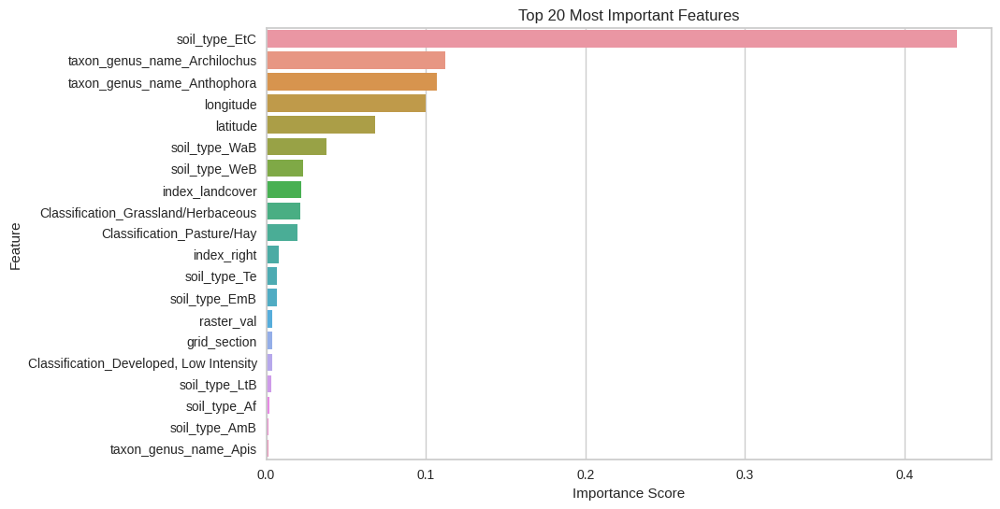

In [74]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)


# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()



### filtering out bee genera

In [75]:
original_list = ['Apis', 'Helianthus', 'Phacelia', 'Andrena', 'Perdita', 'Bombus', 'Peponapis', 'Ceratina', 'Xylocopa', 'Agapostemon', 'Anthophora', 'Martinapis', 'Diadasia', 'Epeolus', 'Triepeolus', 'Hylaeus', 'Caupolicana', 'Colletes', 'Sphecodes', 'Megachilidae', 'Osmia', 'Anthidium']

bees_list = ['taxon_genus_name_' + item for item in original_list]

print(bees_list)


['taxon_genus_name_Apis', 'taxon_genus_name_Helianthus', 'taxon_genus_name_Phacelia', 'taxon_genus_name_Andrena', 'taxon_genus_name_Perdita', 'taxon_genus_name_Bombus', 'taxon_genus_name_Peponapis', 'taxon_genus_name_Ceratina', 'taxon_genus_name_Xylocopa', 'taxon_genus_name_Agapostemon', 'taxon_genus_name_Anthophora', 'taxon_genus_name_Martinapis', 'taxon_genus_name_Diadasia', 'taxon_genus_name_Epeolus', 'taxon_genus_name_Triepeolus', 'taxon_genus_name_Hylaeus', 'taxon_genus_name_Caupolicana', 'taxon_genus_name_Colletes', 'taxon_genus_name_Sphecodes', 'taxon_genus_name_Megachilidae', 'taxon_genus_name_Osmia', 'taxon_genus_name_Anthidium']


In [76]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Apis',
    'taxon_genus_name_Andrena',
    'taxon_genus_name_Perdita',
    'taxon_genus_name_Bombus',
    'taxon_genus_name_Peponapis',
    'taxon_genus_name_Ceratina',
    'taxon_genus_name_Xylocopa',
    'taxon_genus_name_Agapostemon',
    'taxon_genus_name_Anthophora',
    'taxon_genus_name_Diadasia',
    'taxon_genus_name_Epeolus',
    'taxon_genus_name_Triepeolus',
    'taxon_genus_name_Hylaeus',
    'taxon_genus_name_Osmia',
    'taxon_genus_name_Anthidium',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'bees_luse_soil' dataframe with selected columns
bees_luse_soil = data[selected_columns].copy()


In [77]:
bees_luse_soil.head(5)

,grid_section,taxon_genus_name_Apis,taxon_genus_name_Andrena,taxon_genus_name_Perdita,taxon_genus_name_Bombus,taxon_genus_name_Peponapis,taxon_genus_name_Ceratina,taxon_genus_name_Xylocopa,taxon_genus_name_Agapostemon,taxon_genus_name_Anthophora,...,soil_type_TP,soil_type_Te,soil_type_TgB,soil_type_To,soil_type_VF,soil_type_Va,soil_type_VbA,soil_type_Vc,soil_type_WaB,soil_type_WeB
31,46,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
54,65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69,57,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
140,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148,85,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [78]:
# List of columns to sum (those with the prefix 'taxon_genus_name_')
columns_to_sum = [col for col in bees_luse_soil.columns if col.startswith('taxon_genus_name_')]

# Create the 'bees' column by summing counts for each 'grid_section'
bees_luse_soil['bees'] = bees_luse_soil[columns_to_sum].sum(axis=1)


In [79]:
bees_luse_soil['bees'].value_counts()

1.0    2025
0.0    1904
Name: bees, dtype: int64

In [80]:
bees_luse_soil_sim = bees_luse_soil.drop(['taxon_genus_name_Apis',
    'taxon_genus_name_Andrena',
    'taxon_genus_name_Perdita',
    'taxon_genus_name_Bombus',
    'taxon_genus_name_Peponapis',
    'taxon_genus_name_Ceratina',
    'taxon_genus_name_Xylocopa',
    'taxon_genus_name_Agapostemon',
    'taxon_genus_name_Anthophora',
    'taxon_genus_name_Diadasia',
    'taxon_genus_name_Epeolus',
    'taxon_genus_name_Triepeolus',
    'taxon_genus_name_Hylaeus',
    'taxon_genus_name_Osmia',
    'taxon_genus_name_Anthidium'], axis = 1)

In [81]:
bees_luse_soil_sim.head(100)

,grid_section,Classification_Barren Land (Rock/Sand/Clay),Classification_Cultivated Crops,Classification_Developed High Intensity,"Classification_Developed, Low Intensity","Classification_Developed, Medium Intensity","Classification_Developed, Open Space",Classification_Emergent Herbaceous Wetlands,Classification_Evergreen Forest,Classification_Grassland/Herbaceous,...,soil_type_Te,soil_type_TgB,soil_type_To,soil_type_VF,soil_type_Va,soil_type_VbA,soil_type_Vc,soil_type_WaB,soil_type_WeB,bees
31,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
54,65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69,57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
140,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148,85,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2206,85,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2223,65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2311,97,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2315,40,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [82]:
data2=bees_luse_soil_sim.copy()

In [83]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['bees'])  # Features (exclude the target column)
y = data2['bees']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [84]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [85]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [86]:

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse.mean()}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.21
RMSE: 0.46354701490215205
R-squared: 0.13


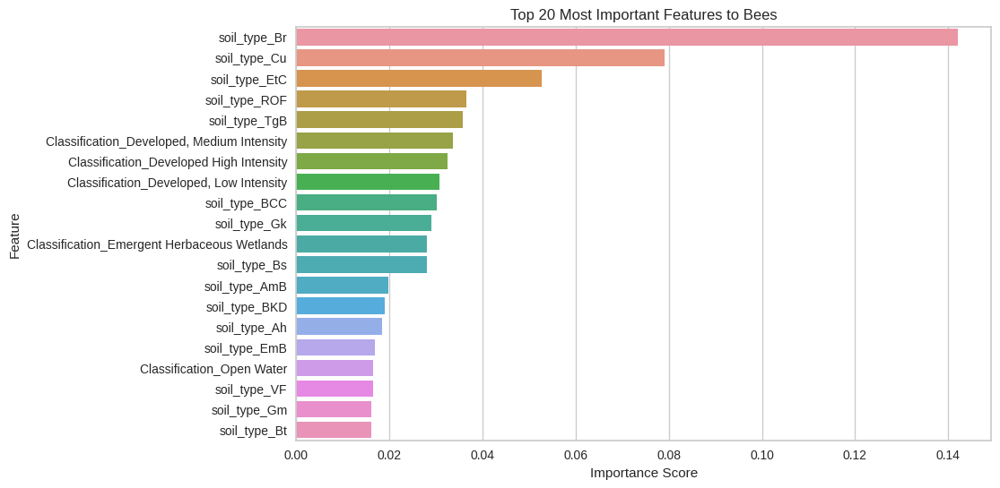

In [87]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Bees')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

In [88]:
top_features = feature_importance_df.head(20)
top_features_list = top_features['Feature'].tolist()
top_features_list

['soil_type_Br',
 'soil_type_Cu',
 'soil_type_EtC',
 'soil_type_ROF',
 'soil_type_TgB',
 'Classification_Developed, Medium Intensity',
 'Classification_Developed High Intensity',
 'Classification_Developed, Low Intensity',
 'soil_type_BCC',
 'soil_type_Gk',
 'Classification_Emergent Herbaceous Wetlands',
 'soil_type_Bs',
 'soil_type_AmB',
 'soil_type_BKD',
 'soil_type_Ah',
 'soil_type_EmB',
 'Classification_Open Water',
 'soil_type_VF',
 'soil_type_Gm',
 'soil_type_Bt']

create a dataframe with only my top 20 features

In [89]:
# List of columns to select
selected_columns = ['grid_section', 'bees', 'soil_type_Br',
 'soil_type_Cu',
 'soil_type_EtC',
 'soil_type_ROF',
 'soil_type_TgB',
 'Classification_Developed, Medium Intensity',
 'Classification_Developed High Intensity',
 'Classification_Developed, Low Intensity',
 'soil_type_BCC',
 'soil_type_Gk',
 'Classification_Emergent Herbaceous Wetlands',
 'soil_type_Bs',
 'soil_type_AmB',
 'soil_type_BKD',
 'soil_type_Ah',
 'soil_type_EmB',
 'Classification_Open Water',
 'soil_type_VF',
 'soil_type_Gm',
 'soil_type_Bt']

# Create the new DataFrame with selected columns
bees_features = bees_luse_soil_sim[selected_columns].copy()

# Display the first few rows of the new DataFrame
print(bees_features.head())


     grid_section  bees  soil_type_Br  soil_type_Cu  soil_type_EtC  \
31             46   1.0           0.0           0.0            0.0   
54             65   0.0           1.0           0.0            0.0   
69             57   1.0           0.0           1.0            0.0   
140            60   0.0           0.0           0.0            0.0   
148            85   0.0           0.0           0.0            0.0   

     soil_type_ROF  soil_type_TgB  Classification_Developed, Medium Intensity  \
31             0.0            0.0                                         0.0   
54             0.0            0.0                                         0.0   
69             0.0            0.0                                         0.0   
140            0.0            0.0                                         0.0   
148            0.0            0.0                                         0.0   

     Classification_Developed High Intensity  \
31                                       0.0

### filtering for hummingbird genera

In [90]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Archilochus', 'taxon_genus_name_Calypte', 'taxon_genus_name_Cynanthus', 'taxon_genus_name_Selasphorus',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
hummingbirds_luse_soil = data[selected_columns].copy()


In [91]:
# List of columns to sum (those with the prefix 'taxon_genus_name_')
columns_to_sum = [col for col in hummingbirds_luse_soil.columns if col.startswith('taxon_genus_name_')]

# Create the 'hummingbirds' column by summing counts for each 'grid_section'
hummingbirds_luse_soil['hummingbirds'] = hummingbirds_luse_soil[columns_to_sum].sum(axis=1)

In [92]:
hummingbirds_luse_soil.head()

,grid_section,taxon_genus_name_Archilochus,taxon_genus_name_Calypte,taxon_genus_name_Cynanthus,taxon_genus_name_Selasphorus,Classification_Barren Land (Rock/Sand/Clay),Classification_Cultivated Crops,Classification_Developed High Intensity,"Classification_Developed, Low Intensity","Classification_Developed, Medium Intensity",...,soil_type_Te,soil_type_TgB,soil_type_To,soil_type_VF,soil_type_Va,soil_type_VbA,soil_type_Vc,soil_type_WaB,soil_type_WeB,hummingbirds
31,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
54,65,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
69,57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
140,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148,85,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [93]:
hummingbirds_luse_soil_sim = hummingbirds_luse_soil.drop(['taxon_genus_name_Archilochus', 'taxon_genus_name_Calypte', 'taxon_genus_name_Cynanthus', 'taxon_genus_name_Selasphorus'], axis = 1)

In [94]:
hummingbirds_luse_soil_sim.head()

,grid_section,Classification_Barren Land (Rock/Sand/Clay),Classification_Cultivated Crops,Classification_Developed High Intensity,"Classification_Developed, Low Intensity","Classification_Developed, Medium Intensity","Classification_Developed, Open Space",Classification_Emergent Herbaceous Wetlands,Classification_Evergreen Forest,Classification_Grassland/Herbaceous,...,soil_type_Te,soil_type_TgB,soil_type_To,soil_type_VF,soil_type_Va,soil_type_VbA,soil_type_Vc,soil_type_WaB,soil_type_WeB,hummingbirds
31,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
54,65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
69,57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
140,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
148,85,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [95]:
data2=hummingbirds_luse_soil_sim.copy()

In [96]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['hummingbirds'])  # Features (exclude the target column)
y = data2['hummingbirds']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [97]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [98]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [99]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.11
RMSE: 0.33
R-squared: 0.14


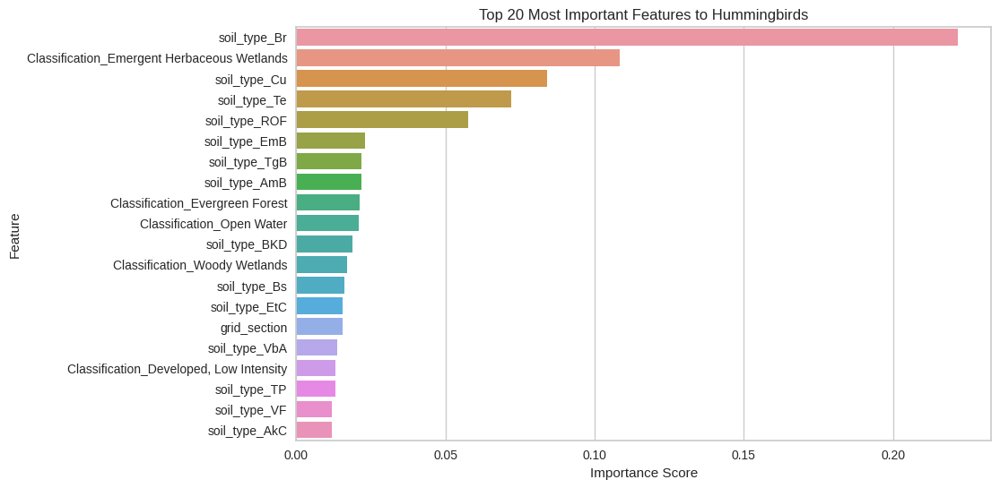

In [100]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Hummingbirds')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

### filtering for coyote

In [101]:
coyote_luse_soil=selected_columns = [
    'grid_section',
    'taxon_genus_name_Canis',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
coyote_luse_soil = data[selected_columns].copy()


In [102]:
data2=coyote_luse_soil.copy()

In [103]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Canis'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Canis']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [104]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [105]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [106]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.05
RMSE: 0.23
R-squared: -0.22


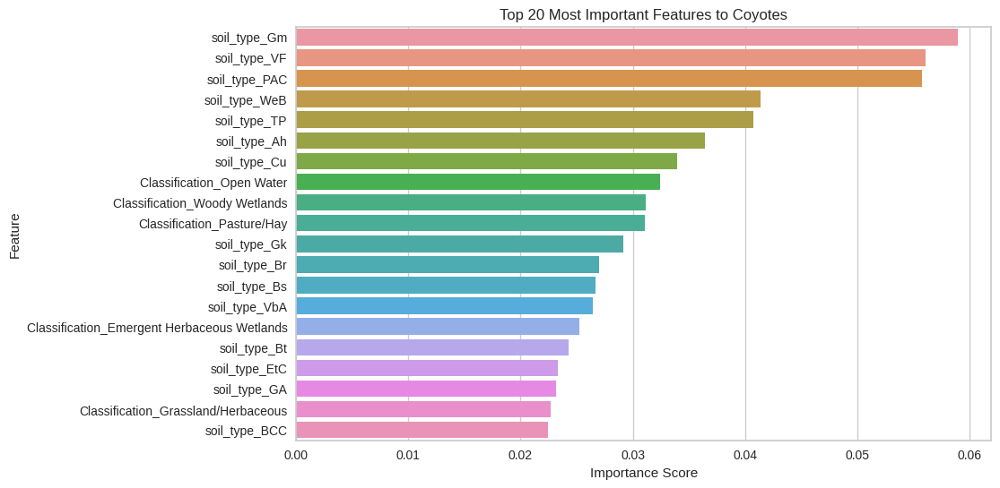

In [107]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Coyotes')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

### Filtering for Bunnies

In [108]:
coyote_luse_soil=selected_columns = [
    'grid_section',
    'taxon_genus_name_Sylvilagus',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
bunny_luse_soil = data[selected_columns].copy()


In [109]:
data2=bunny_luse_soil.copy()

In [110]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Sylvilagus'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Sylvilagus']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [111]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [112]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [113]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.12
RMSE: 0.35
R-squared: 0.02


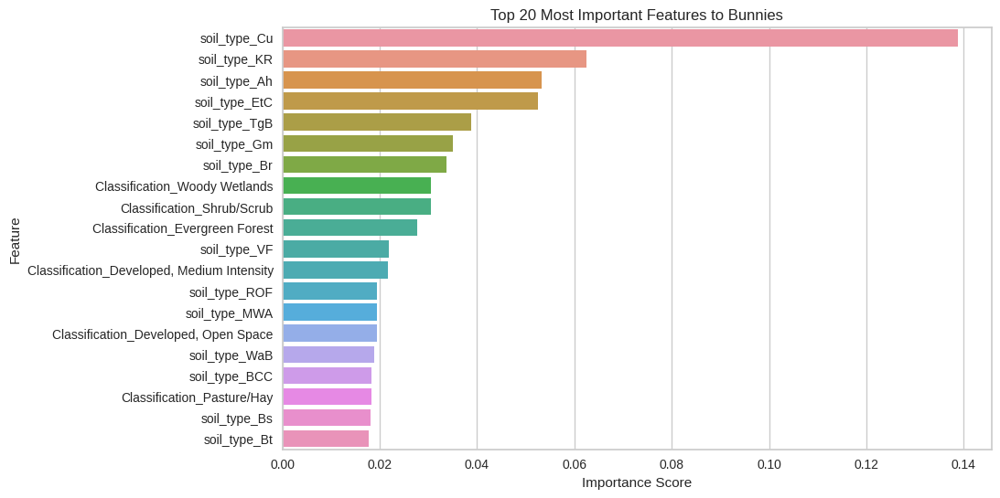

In [114]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Bunnies')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

###filtering for prairie dogs

In [115]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Cynomys',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
pdogs_luse_soil = data[selected_columns].copy()


In [116]:
data2=pdogs_luse_soil.copy()

In [117]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Cynomys'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Cynomys']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [118]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [119]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [120]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.02
RMSE: 0.12
R-squared: -0.36


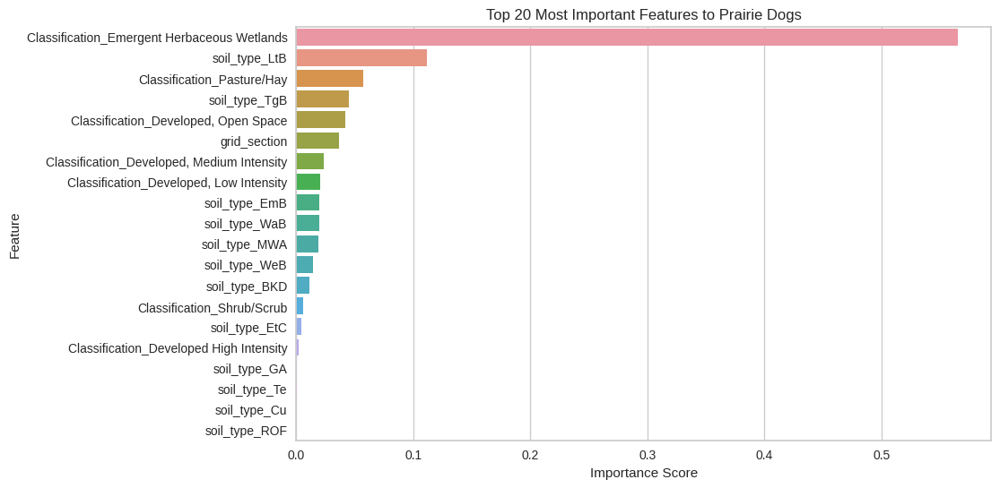

In [121]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Prairie Dogs')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

###filtering for Willow

In [122]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Salix',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
willow_luse_soil = data[selected_columns].copy()


In [123]:
data2=willow_luse_soil.copy()

In [124]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Salix'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Salix']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [125]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [126]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [127]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.01
RMSE: 0.12
R-squared: -0.17


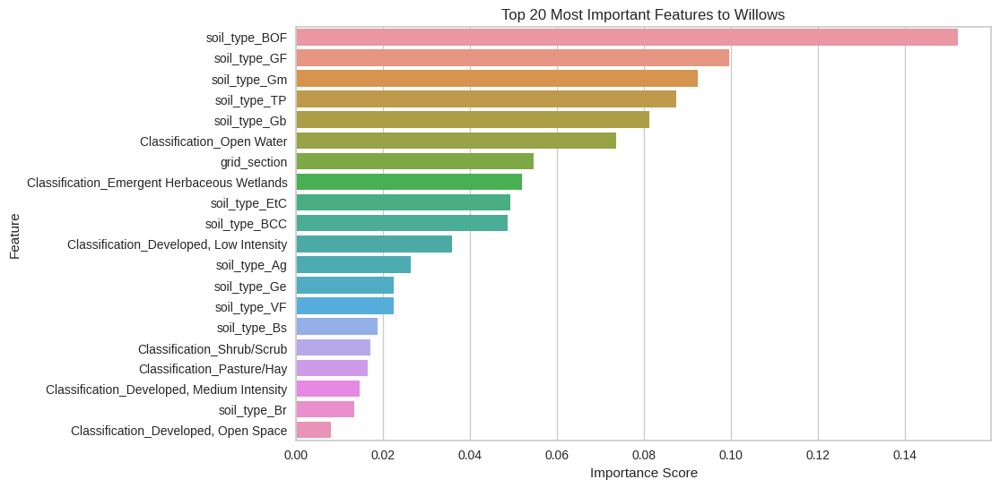

In [128]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Willows')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

###Filtering for Chamisa

In [129]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Ericameria',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
chamisa_luse_soil = data[selected_columns].copy()


In [130]:
data2=chamisa_luse_soil.copy()

In [131]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Ericameria'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Ericameria']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [132]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [133]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [134]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.04
RMSE: 0.19
R-squared: -0.04


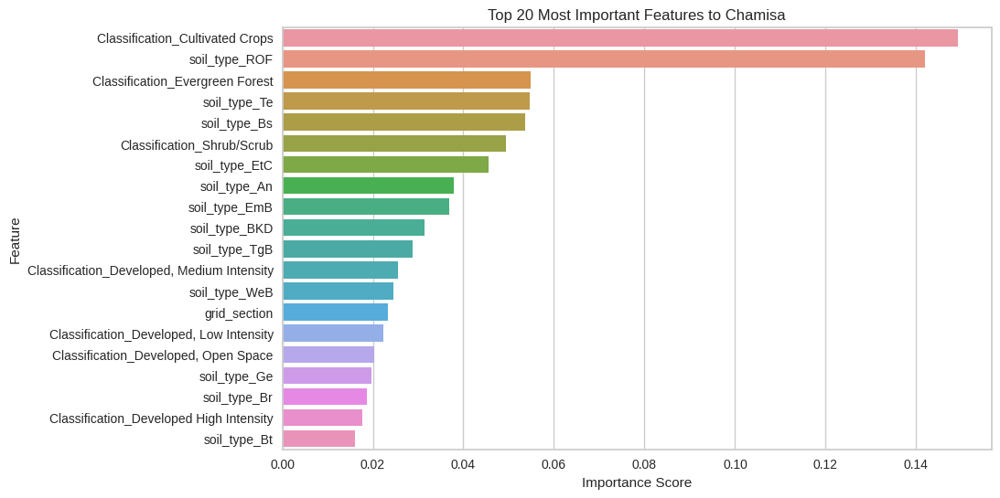

In [135]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Chamisa')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

### Filtering for Cottonwood

In [136]:
selected_columns = [
    'grid_section',
    'taxon_genus_name_Populus',
    'Classification_Barren Land (Rock/Sand/Clay)',
    'Classification_Cultivated Crops',
    'Classification_Developed High Intensity',
    'Classification_Developed, Low Intensity',
    'Classification_Developed, Medium Intensity',
    'Classification_Developed, Open Space',
    'Classification_Emergent Herbaceous Wetlands',
    'Classification_Evergreen Forest',
    'Classification_Grassland/Herbaceous',
    'Classification_Open Water',
    'Classification_Pasture/Hay',
    'Classification_Shrub/Scrub',
    'Classification_Woody Wetlands',
    'soil_type_Af',
    'soil_type_Ag',
    'soil_type_Ah',
    'soil_type_AkC',
    'soil_type_AmB',
    'soil_type_An',
    'soil_type_Ao',
    'soil_type_BCC',
    'soil_type_BKD',
    'soil_type_BOF',
    'soil_type_Bb',
    'soil_type_BcA',
    'soil_type_Br',
    'soil_type_Bs',
    'soil_type_Bt',
    'soil_type_Cu',
    'soil_type_EmB',
    'soil_type_EtC',
    'soil_type_GA',
    'soil_type_GF',
    'soil_type_Gb',
    'soil_type_Gd',
    'soil_type_Ge',
    'soil_type_Gk',
    'soil_type_Gm',
    'soil_type_KR',
    'soil_type_LtB',
    'soil_type_MWA',
    'soil_type_MaB',
    'soil_type_PAC',
    'soil_type_RBE',
    'soil_type_ROF',
    'soil_type_SAF',
    'soil_type_TP',
    'soil_type_Te',
    'soil_type_TgB',
    'soil_type_To',
    'soil_type_VF',
    'soil_type_Va',
    'soil_type_VbA',
    'soil_type_Vc',
    'soil_type_WaB',
    'soil_type_WeB'
]

# Create the 'hummingbirds_luse_soil' dataframe with selected columns
cottonwood_luse_soil = data[selected_columns].copy()


In [137]:
data2=cottonwood_luse_soil.copy()

In [138]:
# Assuming 'data' contains your dataset with features and the 'taxon_genus_name_Agapostemon' target
X = data2.drop(columns=['taxon_genus_name_Populus'])  # Features (exclude the target column)
y = data2['taxon_genus_name_Populus']  # Target variable

# Split the data into a training set and a testing set (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [139]:
# Initialize the XGBoost regressor
xgb_reg = XGBRegressor(random_state=42)

# Train the model on the training data
xgb_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [140]:
# Make predictions on the test data
y_pred = xgb_reg.predict(X_test)

In [141]:
# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calculate RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.03
RMSE: 0.18
R-squared: -0.55


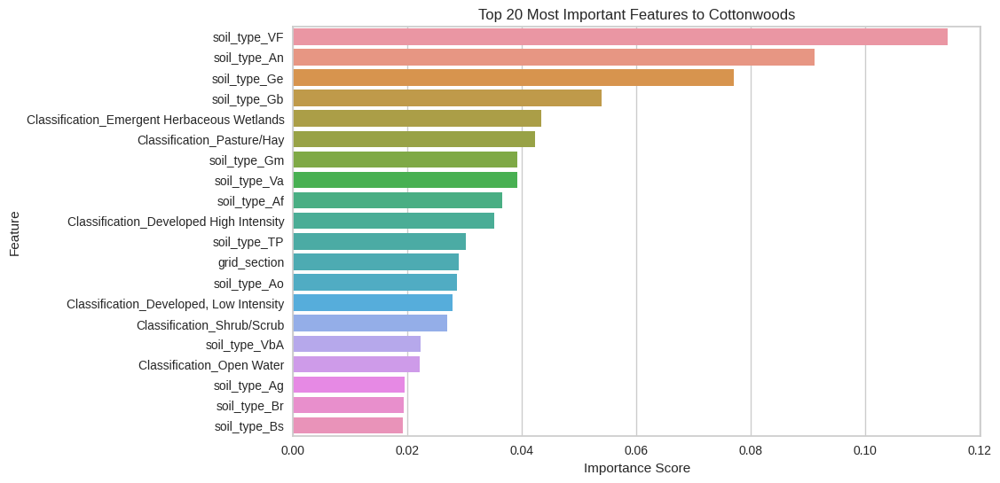

In [142]:
# Get feature importances
feature_importance = xgb_reg.feature_importances_
# Create a DataFrame to store feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 most important features
top_features = feature_importance_df.head(20)

# Create a bar plot of the top 20 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 20 Most Important Features to Cottonwoods')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

##trying a decision tree regression model using top features for each keystone

### decision tree bees

In [143]:
data3=bees_features.copy()

In [144]:
X = data3.drop('bees', axis = 1)
y = data3['bees']

In [145]:
numLoops = 500

rms_error = np.zeros(numLoops)
rmse_error = np.zeros(numLoops)

for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
  model = DecisionTreeRegressor(max_depth=3) # Arbitrarily choosing max_depth of 3
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  rms_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))


 # Calculate RMSE on the test set
  y_pred = model.predict(X_test)
  rmse_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))


print(f"RMSE: {rmse:.2f}")
print(f"RMSE: {rmse:.2f}")

RMSE: 0.18
RMSE: 0.18


find max depth

In [146]:
max_depths = [1,2,3,4,5,6,7,8,9,10]
rms_depth = np.zeros(len(max_depths))
std_depth = np.zeros(len(max_depths))

numLoops = 500

for n, depth in enumerate(max_depths):
  rms_error = np.zeros(numLoops)

  for idx in range(0,numLoops):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
    model = DecisionTreeRegressor(max_depth=depth)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    rms_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))

  rms_depth[n] = rms_error.mean()
  std_depth[n] = rms_error.std()

In [147]:
(
list(zip(max_depths, rms_depth)),
list(zip(max_depths, std_depth))
)


([(1, 0.491697362166847),
  (2, 0.486496268384837),
  (3, 0.4831407943875106),
  (4, 0.47561585108550913),
  (5, 0.47222117323756774),
  (6, 0.46817392498512506),
  (7, 0.46717406621863017),
  (8, 0.4672662392647035),
  (9, 0.46770703188786705),
  (10, 0.46706332970760767)],
 [(1, 0.002774848136221337),
  (2, 0.0033963910519620114),
  (3, 0.004223686532144489),
  (4, 0.006229944692144616),
  (5, 0.006716594581725906),
  (6, 0.006571712733383764),
  (7, 0.006916713847782897),
  (8, 0.006586868635939365),
  (9, 0.00707179210073552),
  (10, 0.007599997570483947)])

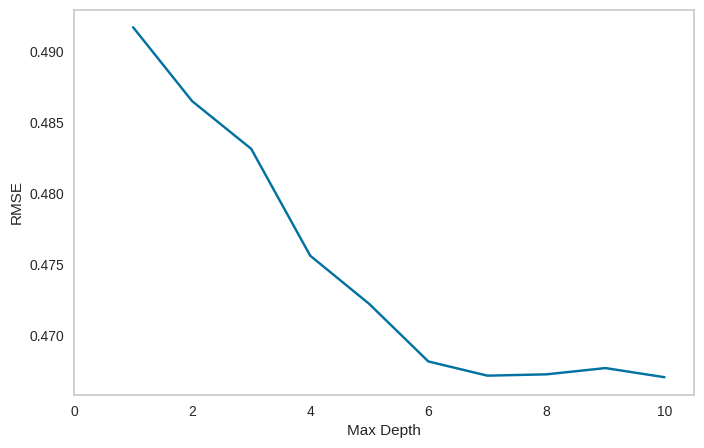

In [148]:
# Plot result
plt.figure(figsize = (8,5))
plt.plot(max_depths, rms_depth)
plt.xlabel('Max Depth')
plt.ylabel('RMSE')
plt.xlim(0, 10.5)
plt.grid()

In [149]:
# Re run with max depth = 8
numLoops = 500

rms_error = np.zeros(numLoops)

for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
  model = DecisionTreeRegressor(max_depth=8)
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  rms_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RMSE: {rmse:.2f}")

RMSE: 0.18


Did not improve RMSE

Visualize the bee decision tree

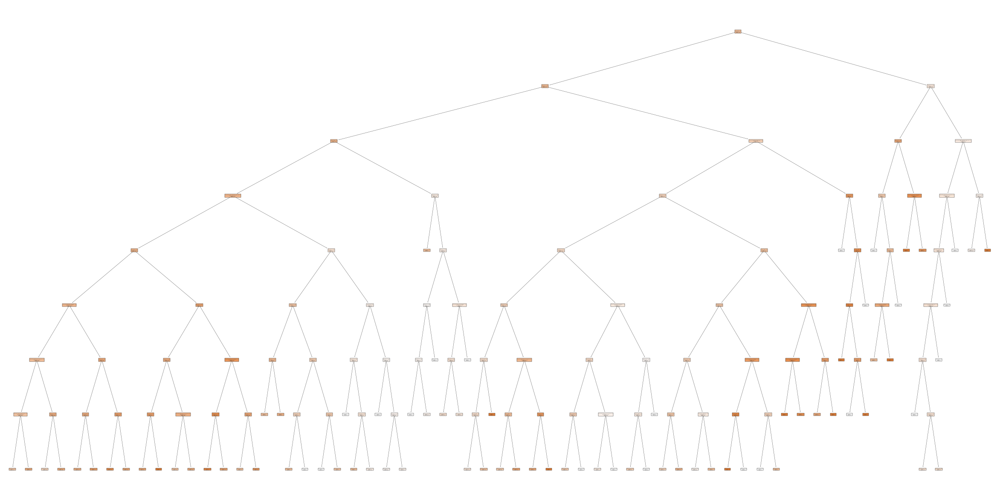

In [150]:
plt.figure(figsize=(30,15))
tree_plot = tree.plot_tree(model, feature_names=X.columns, filled=True)

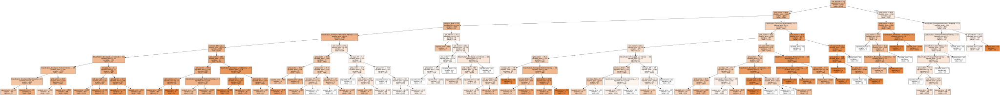

In [151]:
display(graphviz.Source(tree.export_graphviz(model, feature_names=X.columns, filled = True)))

###Decision tree humminbirds

##Trying a random forest regression model using top features for each keystone

###Random Forest bees

In [152]:
data3=bees_features.copy()

In [153]:
X = data3.drop('bees', axis = 1)
y = data3['bees']

In [154]:

# two parameters - n_estimators (number of trees), max_depth (number of splits)
numLoops = 500

mean_error = np.zeros(numLoops)

# np.random.seed(42)
for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
  model = RandomForestRegressor(n_estimators = 10, random_state=0) #n_estimators is number of trees in forest. Note: you can also choose max_depth for RFs
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)

print(f"RMSE: {rmse:.2f}")
print(f'RMSE_std: {np.sqrt(mean_error).std()*1000}')


RMSE: 0.18
RMSE_std: 0.0


##Trying logistic regression model using top features for each keystone

###Logistic Regression bees

In [155]:
data3=bees_features.copy()

In [156]:
X = data3.drop('bees',axis=1).copy()
y = data3['bees'].copy()

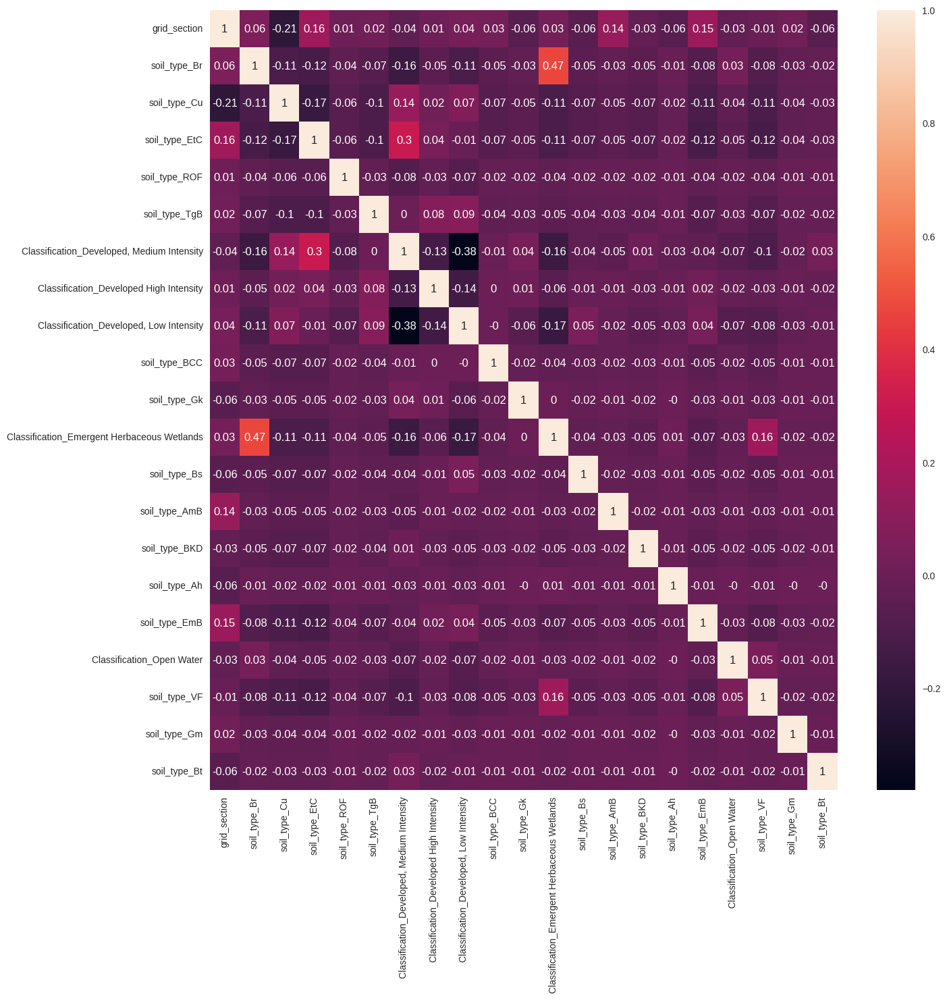

In [157]:
# Checking correlations between predictors
plt.figure(figsize=(15,15))
correlation_matrix = X.corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True) ;

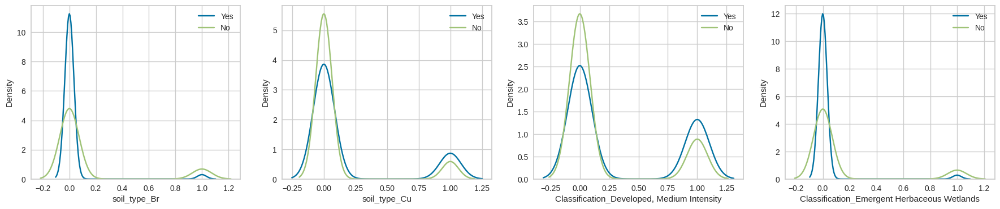

In [158]:
# Look at the distribution of a few predictors for different labels
predictors = ['soil_type_Br', 'soil_type_Cu', 'Classification_Developed, Medium Intensity','Classification_Emergent Herbaceous Wetlands']

fig, axes = plt.subplots(1,4, figsize= (22,4))
for i,pred in enumerate(predictors):
  sns.kdeplot(data3[pred][y==1], label = 'Yes', ax = axes[i])
  sns.kdeplot(data3[pred][y==0], label = 'No', ax = axes[i])
  axes[i].legend()
plt.show()


In [159]:
from sklearn import metrics
#fit logistic regression model
numLoops = 50
predict_accuracy = np.zeros(numLoops)
predict_f1 = np.zeros(numLoops)
predict_rmse = np.zeros(numLoops)

for idx in range(0,50):
  X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2)
  logreg = LogisticRegression(max_iter=1000)
  logreg.fit(X_train,y_train)
  y_pred = logreg.predict(X_test)
  predict_accuracy[idx] = metrics.accuracy_score(y_test,y_pred)
  predict_f1[idx] = metrics.f1_score(y_test,y_pred)
  predict_rmse[idx] = np.sqrt(metrics.mean_squared_error(y_test, y_pred))


print(f"Mean: {predict_accuracy.mean().round(3)}")
print(f"F1 Score: {predict_f1.mean().round(3)}")
print(f"RMSE: {rmse:.2f}")

Mean: 0.648
F1 Score: 0.684
RMSE: 0.18


#Communication of Results

**XGBoost model:**

RMSE Scores from highest to lowest
*   Bees - .46
*   Cottontail Rabbit - .35
*   Hummingbirds - .33
*   Coyote - .31
*   Chamisa - .19
*   Cottonwood - .18
*   Prairie Dog - .12
*   Willow - .12


 Feature Importance Results (lists the top feature and then either the next highest soil type or land use type and its rank)


*   Bees: Soil Type - Br | Land use - Developed, Medium Intensity - ranked at #6
*   Cottontail Rabbit: Soil Type - Cu | Land use - Woody Wetlands - ranked at #8
*   Hummingbirds - Soil Type - Br | Land use - Evergreen Forest - ranked at #9
*   Coyote: Soil Type - GM | Land use - Open Water - ranked at #8
*   Chamisa: Land use - Cultivated Crops | Soil Type - RoF - ranked at #2
*   Cottonwood: Soil Type - VFL | Land use - Emergent Herbaceous Wetlands - ranked at #5
*   Prairie Dog: Land use - Emergent Herbaceous Wetlands | Soil Type - LtB - ranked at #2
*   Willow: Soil Type - BoF | Land use - Open Water - ranked at #6

**Decision Tree Model:**

RMSE

* Bees - .18
* Hummingbirds - .18

RMSE after max depth found and properly set
* Bees - .18

**Random Forest Model:**

RMSE
* Bees - .18

**Logistic Regression:**

RMSE
* Bees - .18

Correlation Matrix
* Highest Correlation: .47 - Between Land use Emergent Herbaceous Wetlands and Soil Type Br
* Lowest Correlation: -.38 - Between Land use Developed, low intensity and Soii Type Cu

**Model Comparisons and final conclusion**

The best RMSEs results came from running XGBoost for prairie dogs and willows. There was a very consistent RMSE between all other models at .18. The featrue importance rankings had the highest scale for Prairie dogs at over .5 and the lowest scale for Coyotes at about .06. The most important features overall are as follows:

* Soil Type Br was found in the top 20 features in 7 out of 8 of the keystone organisms
* Emergent Herbaceous Wetlands were found in the top 20 features in 6 out of 8 of the keystone organisms
* Soil Type Cu was found in the top 20 features in 5 out of 8 of the keystone organisms








